# The Improving Results Notebook

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import random

# import deconvolution methods
import cellanneal
from scipy.optimize import nnls
from sklearn.svm import NuSVR
from sklearn.svm import LinearSVR
from sklearn.preprocessing import StandardScaler


# statistical tests
import scipy.stats
from scipy.stats import pearsonr
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import r2_score

# stats & plot specific from .py files
from src.plot import Plot
from stats import statsTest
from src.helper import flatten, gene_intersection
import src.project_configs as project_configs
from src.deconv import Deconvolution

from tqdm import tqdm

train_flag = False

In [2]:
# plot parameters all coming from project.configurations
plt.style.use(project_configs.style)
plt.rcParams['font.family'] = project_configs.font_family
plt.rcParams['font.serif'] = project_configs.font_serif
plt.rcParams['font.monospace'] = project_configs.font_monospace
plt.rcParams['font.size'] = project_configs.font_size
plt.rcParams['axes.labelsize'] = project_configs.axes_label_size
plt.rcParams['axes.labelweight'] = project_configs.axes_label_weight
plt.rcParams['axes.titlesize'] = project_configs.axes_title_size
plt.rcParams['xtick.labelsize'] = project_configs.xtick_label_size
plt.rcParams['ytick.labelsize'] = project_configs.ytick_label_size
plt.rcParams['legend.fontsize'] = project_configs.legend_font_size 
plt.rcParams['figure.titlesize'] = project_configs.figure_title_size
plt.rcParams['image.cmap'] = project_configs.image_cmap 
plt.rcParams['image.interpolation'] = project_configs.image_interpolation 
plt.rcParams['figure.figsize'] = project_configs.figure_size
plt.rcParams['axes.grid']=project_configs.axes_grid
plt.rcParams['lines.linewidth'] = project_configs.lines_line_width
plt.rcParams['lines.markersize'] = project_configs.lines_marker_size
cells_p = project_configs.cells_p

In [3]:
signature = pd.read_csv("../../../../../cbbi-data00/projects/Methods/bulk-deconvolution/logcpm_marker_gene_expression.by_compartments.csv", index_col=0)
atap_bulk = pd.read_csv('../data/atap.pseudobulk_counts.logcpm.csv',index_col=0)
atap_true = pd.read_csv('../data/atap.scg_proportions.csv',index_col=0)
cleveland_bulk = pd.read_csv('../data/cleveland.pseudobulk_counts.logcpm.csv',index_col=0)
cleveland_true = pd.read_csv('../data/cleveland.scg_proportions.csv',index_col=0)
lmu_bulk = pd.read_csv('../data/lmu.pseudobulk_counts.logcpm.csv',index_col=0)
lmu_true = pd.read_csv('../data/lmu.scg_proportions.csv',index_col=0)

In [4]:
atap_true_general =pd.DataFrame()          
atap_true_general['Myeloid'] = atap_true['CD209+ moDC'] + atap_true['CD83+ CLEC9A+ DC'] + atap_true['CD83- CLEC9A+ DC']+atap_true['CLEC10A+ DC']+atap_true['IL7R+ Activated DC']+atap_true['Mast Cell']+atap_true['Memory B cell']+atap_true['Monocyte Inflammatory']+atap_true['Proliferating myeloid']+atap_true['Resident Macrophage']
atap_true_general['T Cell'] = atap_true['CD4 SELL naive'] + atap_true['CD4 TRM'] + atap_true['CD4 Tfh']+atap_true['CD4 Th17']+atap_true['CD4 Tph']+atap_true['CD4 Treg']+atap_true['CD8 Effector']+atap_true['CD8 IEL']+atap_true['CD8 SELL Naive']+atap_true['ILC3']+atap_true['MAIT']+atap_true['NK']+atap_true['Proliferating T cells']+atap_true['gd T cell 1']+atap_true['gd T cell 2']
atap_true_general['B Cell'] = atap_true['GC-like B cell'] + atap_true['Memory B cell'] + atap_true['Naive B cell']+atap_true['Plasma Cell']+atap_true['Plasmablast']
atap_true_general['Stroma'] = atap_true['Arterial Pericyte'] + atap_true['Blood Endothelial Cell'] + atap_true['Fibroblast']+atap_true['Glial Cell']+atap_true['Inflammatory Fibroblast']+atap_true['Myofibroblast']+atap_true['Pericyte']+atap_true['Post-capillary venules']+atap_true['Proliferating Stromal Cell']+atap_true['Smooth Muscle Cell']
atap_true_general['Epithelium'] = atap_true['Enterocyte'] + atap_true['Enteroendocrine Cell'] + atap_true['Epithelial M Cell']+atap_true['Epithelial Progenitor Cell']+atap_true['Epithelial Stem Cell']+atap_true['Goblet Cell']+atap_true['Tuft Cell']

In [5]:
cleveland_true_general =pd.DataFrame()          
cleveland_true_general['Myeloid'] = cleveland_true['CD209+ moDC'] + cleveland_true['CD83+ CLEC9A+ DC'] + cleveland_true['CD83- CLEC9A+ DC']+cleveland_true['CLEC10A+ DC']+cleveland_true['IL7R+ Activated DC']+cleveland_true['Mast Cell']+cleveland_true['Memory B cell']+cleveland_true['Monocyte Inflammatory']+cleveland_true['Proliferating myeloid']+cleveland_true['Resident Macrophage']
cleveland_true_general['T Cell'] = cleveland_true['CD4 SELL naive'] + cleveland_true['CD4 TRM'] + cleveland_true['CD4 Tfh']+cleveland_true['CD4 Th17']+cleveland_true['CD4 Tph']+cleveland_true['CD4 Treg']+cleveland_true['CD8 Effector']+cleveland_true['CD8 IEL']+cleveland_true['CD8 SELL Naive']+cleveland_true['ILC3']+cleveland_true['MAIT']+cleveland_true['NK']+cleveland_true['Proliferating T cells']+cleveland_true['gd T cell 1']+cleveland_true['gd T cell 2']
cleveland_true_general['B Cell'] = cleveland_true['GC-like B cell'] + cleveland_true['Memory B cell'] + cleveland_true['Naive B cell']+cleveland_true['Plasma Cell']+cleveland_true['Plasmablast']
cleveland_true_general['Stroma'] = cleveland_true['Arterial Pericyte'] + cleveland_true['Blood Endothelial Cell'] + cleveland_true['Fibroblast']+cleveland_true['Glial Cell']+cleveland_true['Inflammatory Fibroblast']+cleveland_true['Myofibroblast']+cleveland_true['Pericyte']+cleveland_true['Post-capillary venules']+cleveland_true['Proliferating Stromal Cell']+cleveland_true['Smooth Muscle Cell']
cleveland_true_general['Epithelium'] = cleveland_true['Enterocyte'] + cleveland_true['Enteroendocrine Cell'] + cleveland_true['Epithelial M Cell']+cleveland_true['Epithelial Progenitor Cell']+cleveland_true['Epithelial Stem Cell']+cleveland_true['Goblet Cell']+cleveland_true['Tuft Cell']

In [6]:
lmu_true_general =pd.DataFrame()          
lmu_true_general['Myeloid'] = lmu_true['CD209+ moDC'] + lmu_true['CD83+ CLEC9A+ DC'] + lmu_true['CD83- CLEC9A+ DC']+lmu_true['CLEC10A+ DC']+lmu_true['IL7R+ Activated DC']+lmu_true['Mast Cell']+lmu_true['Memory B cell']+lmu_true['Monocyte Inflammatory']+lmu_true['Proliferating myeloid']+lmu_true['Resident Macrophage']
lmu_true_general['T Cell'] = lmu_true['CD4 SELL naive'] + lmu_true['CD4 TRM'] + lmu_true['CD4 Tfh']+lmu_true['CD4 Th17']+lmu_true['CD4 Tph']+lmu_true['CD4 Treg']+lmu_true['CD8 Effector']+lmu_true['CD8 IEL']+lmu_true['CD8 SELL Naive']+lmu_true['ILC3']+lmu_true['MAIT']+lmu_true['NK']+lmu_true['Proliferating T cells']+lmu_true['gd T cell 1']+lmu_true['gd T cell 2']
lmu_true_general['B Cell'] = lmu_true['GC-like B cell'] + lmu_true['Memory B cell'] + lmu_true['Naive B cell']+lmu_true['Plasma Cell']+lmu_true['Plasmablast']
lmu_true_general['Stroma'] = lmu_true['Arterial Pericyte'] + lmu_true['Blood Endothelial Cell'] + lmu_true['Fibroblast']+lmu_true['Glial Cell']+lmu_true['Inflammatory Fibroblast']+lmu_true['Myofibroblast']+lmu_true['Pericyte']+lmu_true['Post-capillary venules']+lmu_true['Proliferating Stromal Cell']+lmu_true['Smooth Muscle Cell']
lmu_true_general['Epithelium'] = lmu_true['Enterocyte'] + lmu_true['Enteroendocrine Cell'] + lmu_true['Epithelial M Cell']+lmu_true['Epithelial Progenitor Cell']+lmu_true['Epithelial Stem Cell']+lmu_true['Goblet Cell']+lmu_true['Tuft Cell']

In [7]:
deconvolution_object = Deconvolution()
plot_object = Plot()

# logcpm normal deconvolution

In [8]:
if train_flag:
    models = deconvolution_object.train(signature, atap_bulk)
    models[0].to_csv("../data/results4/cellanneal_atap_logcpm.csv")
    models[1].to_csv("../data/results4/svr_atap_logcpm.csv")
    models = deconvolution_object.train(signature, cleveland_bulk)
    models[0].to_csv("../data/results4/cellanneal_cleveland_logcpm.csv")
    models[1].to_csv("../data/results4/svr_cleveland_logcpm.csv")
    models = deconvolution_object.train(signature, lmu_bulk)
    models[0].to_csv("../data/results4/cellanneal_lmu_logcpm.csv")
    models[1].to_csv("../data/results4/svr_lmu_logcpm.csv")
else:
    cellanneal_atap = pd.read_csv("../data/results4/cellanneal_atap_logcpm.csv",index_col=0)
    svr_atap = pd.read_csv("../data/results4/svr_atap_logcpm.csv",index_col=0)
    cellanneal_cleveland = pd.read_csv("../data/results4/cellanneal_cleveland_logcpm.csv",index_col=0)
    svr_cleveland =  pd.read_csv("../data/results4/svr_cleveland_logcpm.csv",index_col=0)
    cellanneal_lmu =  pd.read_csv("../data/results4/cellanneal_lmu_logcpm.csv",index_col=0)
    svr_lmu = pd.read_csv("../data/results4/svr_lmu_logcpm.csv",index_col=0)

In [9]:
cells_p = {'B Cell': '#558ce0',
            'T Cell': '#28a35c',
            'Myeloid': '#58d3bb',
            'Stroma': '#eaabcc',
            'Epithelium': '#F6783E',
}

In [10]:
signature

,B Cell,Epithelium,Myeloid,Stroma,T Cell
IGHV3-13,4.980656,1.333944,1.864680,1.532558,1.954512
CEACAM7,4.380691,9.786583,3.619825,2.426693,3.630942
HNF4A,3.485610,8.545540,2.476539,1.870433,2.601221
IGLV10-54,6.287763,1.377721,2.887041,2.401113,3.306973
RAB25,4.972021,9.833682,3.448122,2.608023,4.056638
...,...,...,...,...,...
TRGC1,2.219735,1.275100,4.801744,0.742623,8.243333
IFI30,8.746951,4.623365,9.757329,3.657667,4.645844
VIL1,4.750310,9.462102,3.779563,2.664320,4.173139
BMP5,2.511312,0.784588,2.129530,7.798015,1.550607


array([<AxesSubplot: title={'center': 'B Cell, Spearman = 0.36\np = 0.001'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Epithelium, Spearman = 0.842\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Myeloid, Spearman = 0.19\np = 0.1'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Stroma, Spearman = 0.923\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'T Cell, Spearman = 0.721\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>],
      dtype=object)

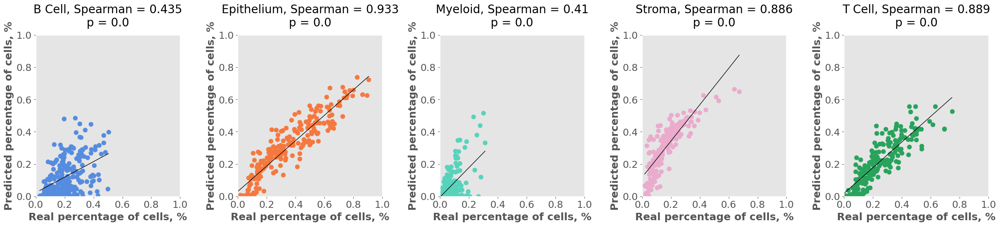

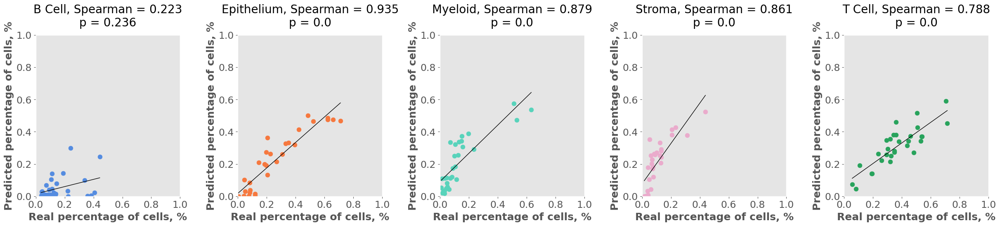

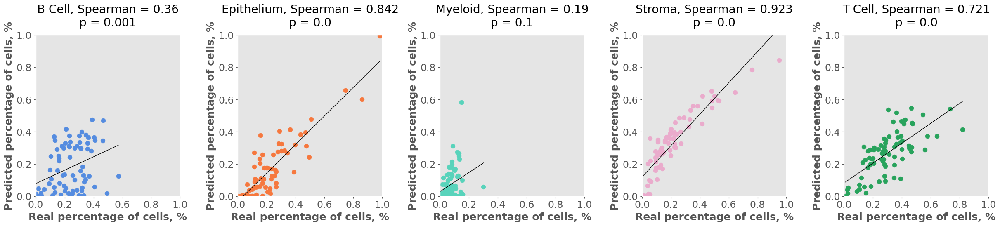

In [11]:
plot_object.plot_cell(cellanneal_atap.T, atap_true_general.T, pallete=cells_p)
plot_object.plot_cell(cellanneal_cleveland.T, cleveland_true_general.T, pallete=cells_p)
plot_object.plot_cell(cellanneal_lmu.T, lmu_true_general.T, pallete=cells_p)

array([<AxesSubplot: title={'center': 'B Cell, Spearman = 0.721\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Epithelium, Spearman = 0.884\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Myeloid, Spearman = 0.239\np = 0.038'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Stroma, Spearman = 0.882\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'T Cell, Spearman = 0.877\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>],
      dtype=object)

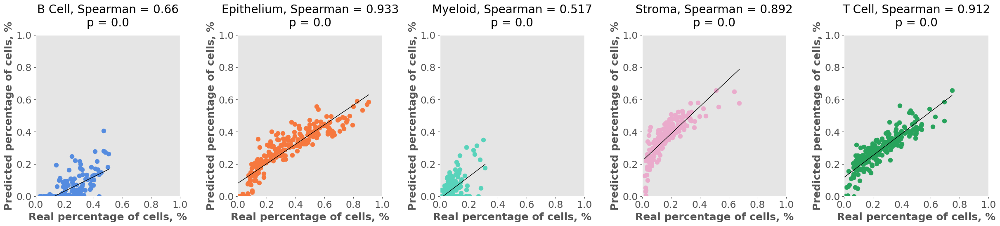

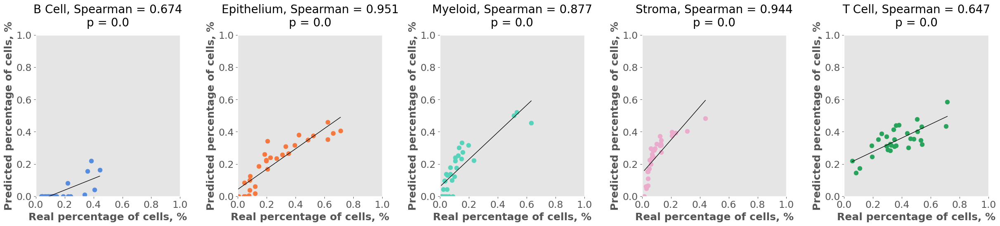

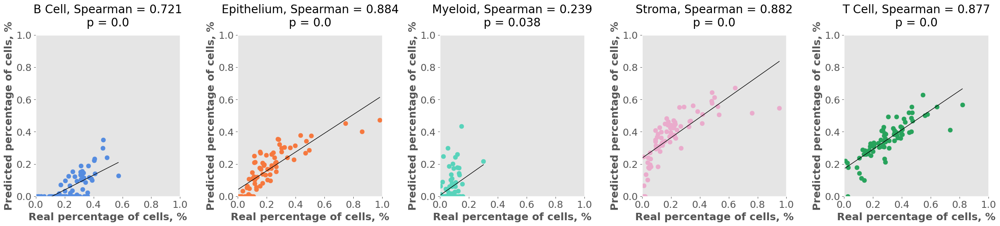

In [12]:
plot_object.plot_cell(svr_atap, atap_true_general.T, pallete=cells_p)
plot_object.plot_cell(svr_cleveland, cleveland_true_general.T, pallete=cells_p)
plot_object.plot_cell(svr_lmu, lmu_true_general.T, pallete=cells_p)

# Compartment Knockout Study

In [13]:
signature

,B Cell,Epithelium,Myeloid,Stroma,T Cell
IGHV3-13,4.980656,1.333944,1.864680,1.532558,1.954512
CEACAM7,4.380691,9.786583,3.619825,2.426693,3.630942
HNF4A,3.485610,8.545540,2.476539,1.870433,2.601221
IGLV10-54,6.287763,1.377721,2.887041,2.401113,3.306973
RAB25,4.972021,9.833682,3.448122,2.608023,4.056638
...,...,...,...,...,...
TRGC1,2.219735,1.275100,4.801744,0.742623,8.243333
IFI30,8.746951,4.623365,9.757329,3.657667,4.645844
VIL1,4.750310,9.462102,3.779563,2.664320,4.173139
BMP5,2.511312,0.784588,2.129530,7.798015,1.550607


make some other columns

In [14]:
signature["Other1"] = 0
signature["Other2"] = signature.mean(axis=1)
signature

,B Cell,Epithelium,Myeloid,Stroma,T Cell,Other1,Other2
IGHV3-13,4.980656,1.333944,1.864680,1.532558,1.954512,0,1.944392
CEACAM7,4.380691,9.786583,3.619825,2.426693,3.630942,0,3.974122
HNF4A,3.485610,8.545540,2.476539,1.870433,2.601221,0,3.163224
IGLV10-54,6.287763,1.377721,2.887041,2.401113,3.306973,0,2.710102
RAB25,4.972021,9.833682,3.448122,2.608023,4.056638,0,4.153081
...,...,...,...,...,...,...,...
TRGC1,2.219735,1.275100,4.801744,0.742623,8.243333,0,2.880422
IFI30,8.746951,4.623365,9.757329,3.657667,4.645844,0,5.238526
VIL1,4.750310,9.462102,3.779563,2.664320,4.173139,0,4.138239
BMP5,2.511312,0.784588,2.129530,7.798015,1.550607,0,2.462342


remove B cell

In [15]:
if train_flag:
    temp = signature.drop("B Cell", axis=1)
    models = deconvolution_object.train(temp, atap_bulk)
    models[0].to_csv("../data/results4/cellanneal_atap_logcpm_noB.csv")
    models[1].to_csv("../data/results4/svr_atap_logcpm_noB.csv")
    models = deconvolution_object.train(temp, cleveland_bulk)
    models[0].to_csv("../data/results4/cellanneal_cleveland_logcpm_noB.csv")
    models[1].to_csv("../data/results4/svr_cleveland_logcpm_noB.csv")
    models = deconvolution_object.train(temp, lmu_bulk)
    models[0].to_csv("../data/results4/cellanneal_lmu_logcpm_noB.csv")
    models[1].to_csv("../data/results4/svr_lmu_logcpm_noB.csv")
else:
    cellanneal_atap_noB = pd.read_csv("../data/results4/cellanneal_atap_logcpm_noB.csv", index_col=0)
    svr_atap_noB = pd.read_csv("../data/results4/svr_atap_logcpm_noB.csv", index_col=0)
    cellanneal_cleveland_noB = pd.read_csv("../data/results4/cellanneal_cleveland_logcpm_noB.csv", index_col=0)
    svr_cleveland_noB = pd.read_csv("../data/results4/svr_cleveland_logcpm_noB.csv", index_col=0)
    cellanneal_lmu_noB = pd.read_csv("../data/results4/cellanneal_lmu_logcpm_noB.csv", index_col=0)
    svr_lmu_noB = pd.read_csv("../data/results4/svr_lmu_logcpm_noB.csv", index_col=0)

array([<AxesSubplot: title={'center': 'Epithelium, Spearman = 0.839\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Myeloid, Spearman = 0.41\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Stroma, Spearman = 0.862\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'T Cell, Spearman = 0.734\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>],
      dtype=object)

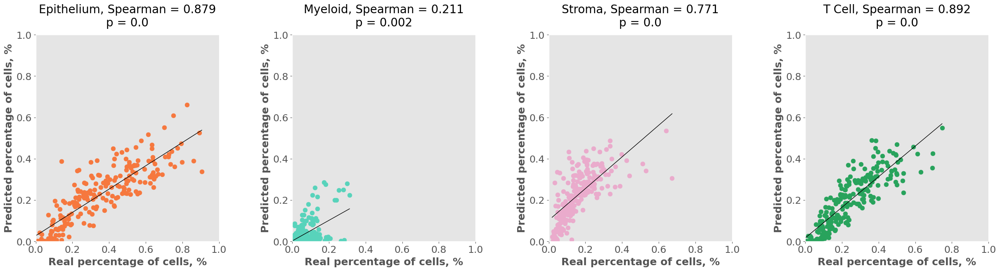

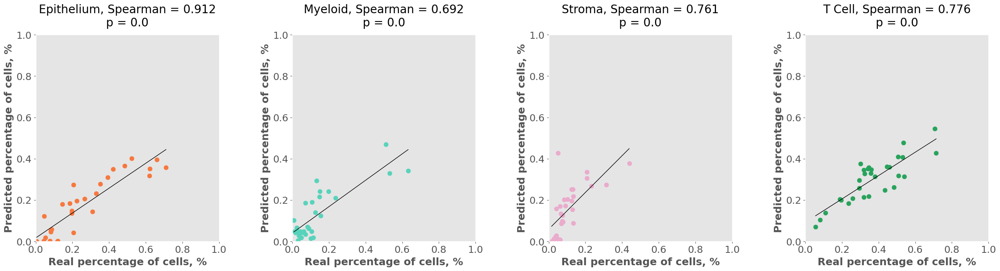

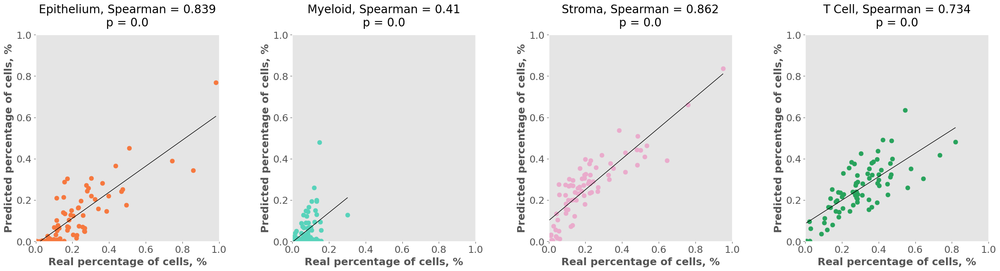

In [16]:
plot_object.plot_cell(cellanneal_atap_noB.T, atap_true_general.T, pallete=cells_p)
plot_object.plot_cell(cellanneal_cleveland_noB.T, cleveland_true_general.T, pallete=cells_p)
plot_object.plot_cell(cellanneal_lmu_noB.T, lmu_true_general.T, pallete=cells_p)


array([<AxesSubplot: title={'center': 'Epithelium, Spearman = 0.809\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Myeloid, Spearman = 0.077\np = 0.508'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Stroma, Spearman = 0.747\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'T Cell, Spearman = 0.526\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>],
      dtype=object)

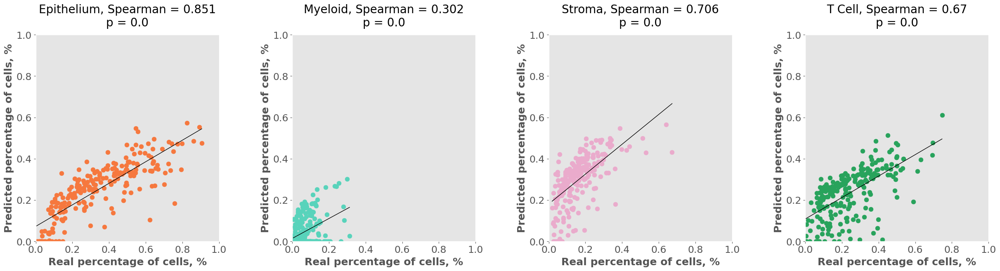

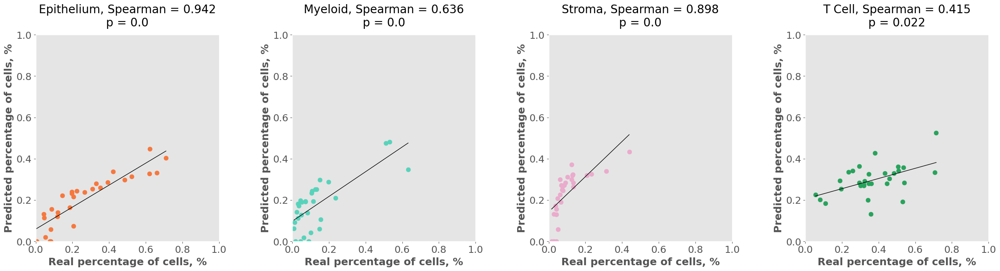

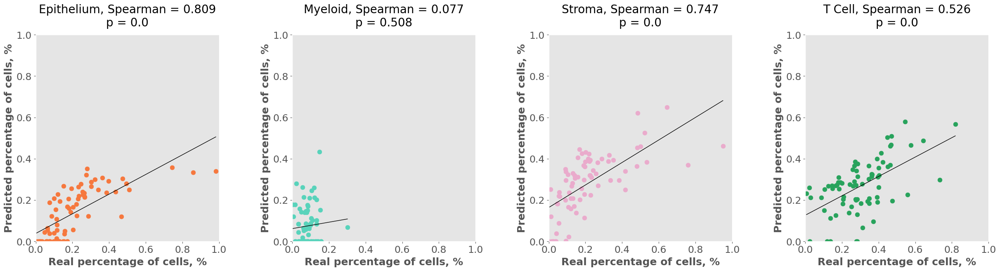

In [17]:
plot_object.plot_cell(svr_atap_noB, atap_true_general.T, pallete=cells_p)
plot_object.plot_cell(svr_cleveland_noB, cleveland_true_general.T, pallete=cells_p)
plot_object.plot_cell(svr_lmu_noB, lmu_true_general.T, pallete=cells_p)


No T cell

In [18]:
if train_flag:
    temp = signature.drop("T Cell", axis=1)
    models = deconvolution_object.train(temp, atap_bulk)
    models[0].to_csv("../data/results4/cellanneal_atap_logcpm_noT.csv")
    models[1].to_csv("../data/results4/svr_atap_logcpm_noT.csv")
    models = deconvolution_object.train(temp, cleveland_bulk)
    models[0].to_csv("../data/results4/cellanneal_cleveland_logcpm_noT.csv")
    models[1].to_csv("../data/results4/svr_cleveland_logcpm_noT.csv")
    models = deconvolution_object.train(temp, lmu_bulk)
    models[0].to_csv("../data/results4/cellanneal_lmu_logcpm_noT.csv")
    models[1].to_csv("../data/results4/svr_lmu_logcpm_noT.csv")
else:
    cellanneal_atap_noT = pd.read_csv("../data/results4/cellanneal_atap_logcpm_noT.csv", index_col=0)
    svr_atap_noT = pd.read_csv("../data/results4/svr_atap_logcpm_noT.csv", index_col=0)
    cellanneal_cleveland_noT = pd.read_csv("../data/results4/cellanneal_cleveland_logcpm_noT.csv", index_col=0)
    svr_cleveland_noT = pd.read_csv("../data/results4/svr_cleveland_logcpm_noT.csv", index_col=0)
    cellanneal_lmu_noT = pd.read_csv("../data/results4/cellanneal_lmu_logcpm_noT.csv", index_col=0)
    svr_lmu_noT = pd.read_csv("../data/results4/svr_lmu_logcpm_noT.csv", index_col=0)

array([<AxesSubplot: title={'center': 'B Cell, Spearman = 0.478\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Epithelium, Spearman = 0.803\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Myeloid, Spearman = 0.155\np = 0.181'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Stroma, Spearman = 0.857\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>],
      dtype=object)

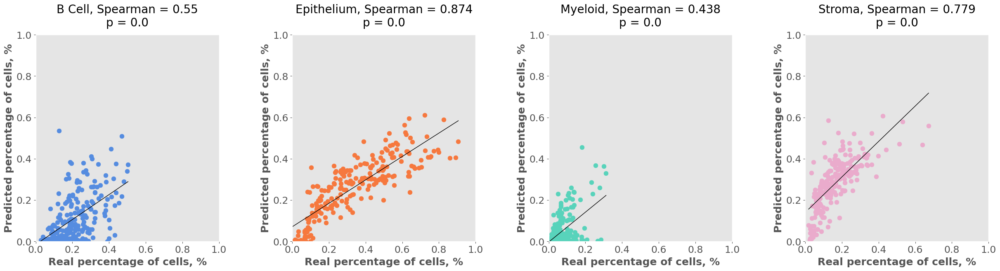

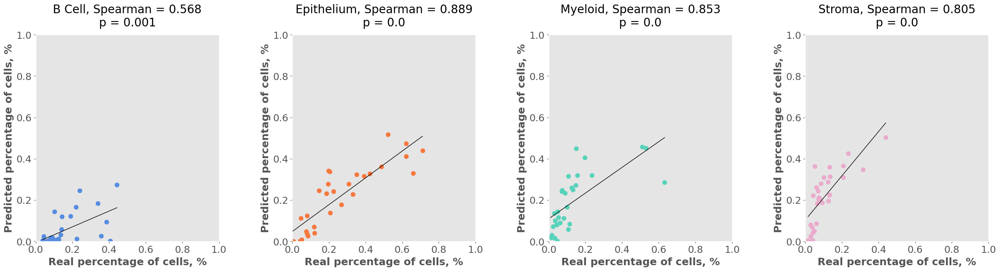

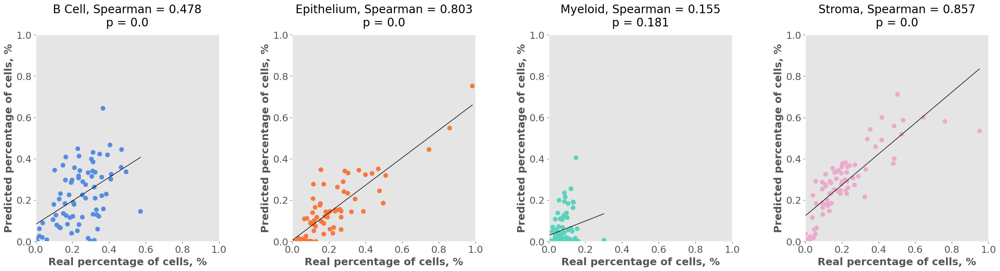

In [19]:
plot_object.plot_cell(cellanneal_atap_noT.T, atap_true_general.T, pallete=cells_p)
plot_object.plot_cell(cellanneal_cleveland_noT.T, cleveland_true_general.T, pallete=cells_p)
plot_object.plot_cell(cellanneal_lmu_noT.T, lmu_true_general.T, pallete=cells_p)


array([<AxesSubplot: title={'center': 'B Cell, Spearman = 0.262\np = 0.022'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Epithelium, Spearman = 0.491\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Myeloid, Spearman = 0.021\np = 0.855'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Stroma, Spearman = 0.717\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>],
      dtype=object)

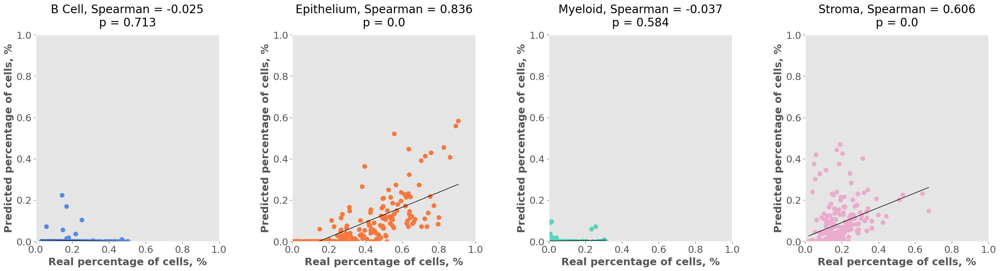

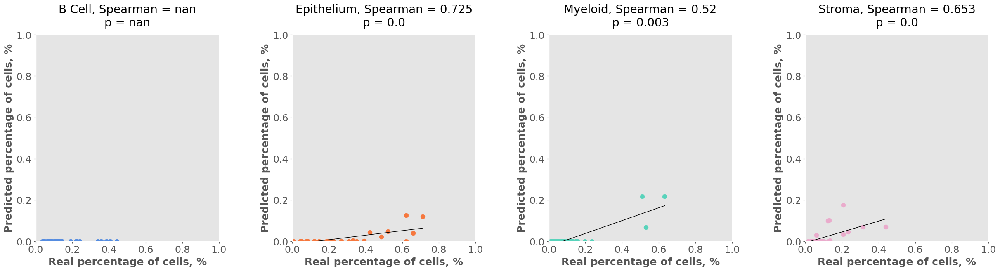

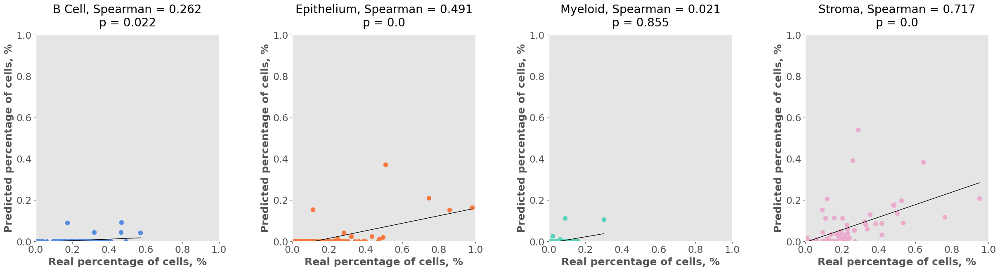

In [20]:
plot_object.plot_cell(svr_atap_noT, atap_true_general.T, pallete=cells_p)
plot_object.plot_cell(svr_cleveland_noT, cleveland_true_general.T, pallete=cells_p)
plot_object.plot_cell(svr_lmu_noT, lmu_true_general.T, pallete=cells_p)

no Epithelium

In [21]:
if train_flag:
    temp = signature.drop("Epithelium", axis=1)
    models = deconvolution_object.train(temp, atap_bulk)
    models[0].to_csv("../data/results4/cellanneal_atap_logcpm_noE.csv")
    models[1].to_csv("../data/results4/svr_atap_logcpm_noE.csv")
    models = deconvolution_object.train(temp, cleveland_bulk)
    models[0].to_csv("../data/results4/cellanneal_cleveland_logcpm_noE.csv")
    models[1].to_csv("../data/results4/svr_cleveland_logcpm_noE.csv")
    models = deconvolution_object.train(temp, lmu_bulk)
    models[0].to_csv("../data/results4/cellanneal_lmu_logcpm_noE.csv")
    models[1].to_csv("../data/results4/svr_lmu_logcpm_noE.csv")
else:
    cellanneal_atap_noE = pd.read_csv("../data/results4/cellanneal_atap_logcpm_noE.csv", index_col=0)
    svr_atap_noE = pd.read_csv("../data/results4/svr_atap_logcpm_noE.csv", index_col=0)
    cellanneal_cleveland_noE = pd.read_csv("../data/results4/cellanneal_cleveland_logcpm_noE.csv", index_col=0)
    svr_cleveland_noE = pd.read_csv("../data/results4/svr_cleveland_logcpm_noE.csv", index_col=0)
    cellanneal_lmu_noE = pd.read_csv("../data/results4/cellanneal_lmu_logcpm_noE.csv", index_col=0)
    svr_lmu_noE = pd.read_csv("../data/results4/svr_lmu_logcpm_noE.csv", index_col=0)

array([<AxesSubplot: title={'center': 'B Cell, Spearman = 0.495\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Myeloid, Spearman = 0.129\np = 0.267'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Stroma, Spearman = 0.81\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'T Cell, Spearman = 0.659\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>],
      dtype=object)

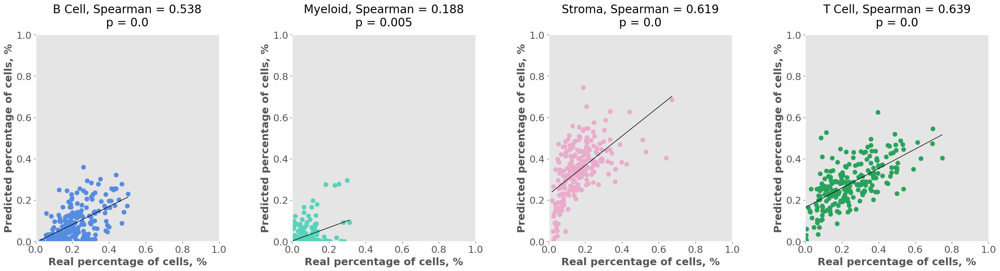

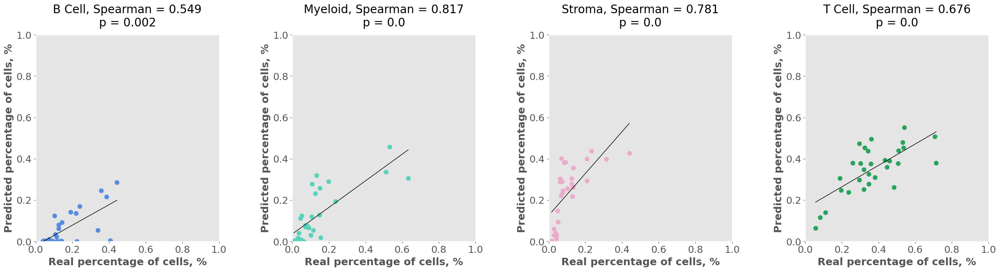

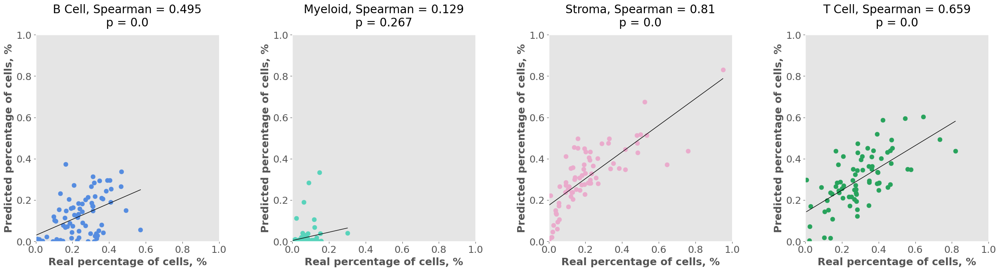

In [22]:
plot_object.plot_cell(cellanneal_atap_noE.T, atap_true_general.T, pallete=cells_p)
plot_object.plot_cell(cellanneal_cleveland_noE.T, cleveland_true_general.T, pallete=cells_p)
plot_object.plot_cell(cellanneal_lmu_noE.T, lmu_true_general.T, pallete=cells_p)


array([<AxesSubplot: title={'center': 'B Cell, Spearman = 0.444\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Myeloid, Spearman = 0.329\np = 0.004'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Stroma, Spearman = 0.667\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'T Cell, Spearman = 0.553\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>],
      dtype=object)

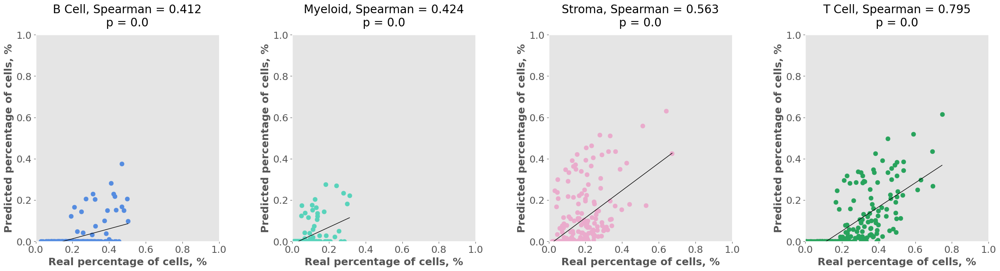

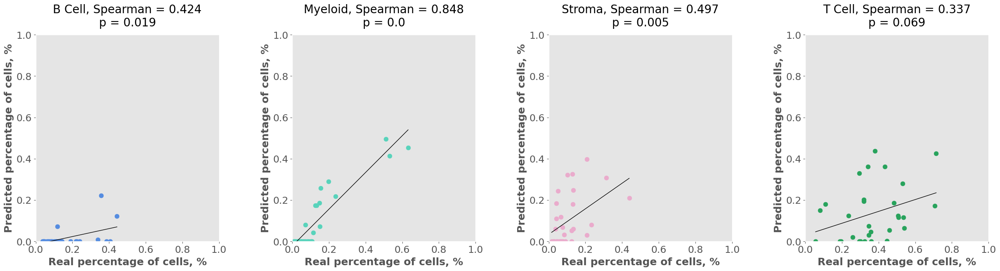

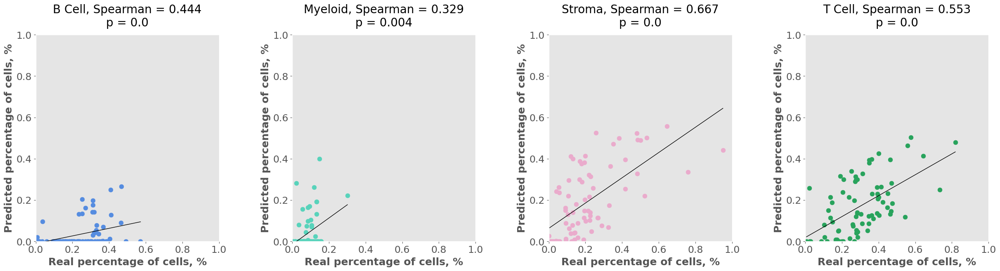

In [23]:
plot_object.plot_cell(svr_atap_noE, atap_true_general.T, pallete=cells_p)
plot_object.plot_cell(svr_cleveland_noE, cleveland_true_general.T, pallete=cells_p)
plot_object.plot_cell(svr_lmu_noE, lmu_true_general.T, pallete=cells_p)

no Myeloid

In [24]:
if train_flag:
    temp = signature.drop("Myeloid", axis=1)
    models = deconvolution_object.train(temp, atap_bulk)
    models[0].to_csv("../data/results4/cellanneal_atap_logcpm_noM.csv")
    models[1].to_csv("../data/results4/svr_atap_logcpm_noM.csv")
    models = deconvolution_object.train(temp, cleveland_bulk)
    models[0].to_csv("../data/results4/cellanneal_cleveland_logcpm_noM.csv")
    models[1].to_csv("../data/results4/svr_cleveland_logcpm_noM.csv")
    models = deconvolution_object.train(temp, lmu_bulk)
    models[0].to_csv("../data/results4/cellanneal_lmu_logcpm_noM.csv")
    models[1].to_csv("../data/results4/svr_lmu_logcpm_noM.csv")
else:
    cellanneal_atap_noM = pd.read_csv("../data/results4/cellanneal_atap_logcpm_noM.csv", index_col=0)
    svr_atap_noM = pd.read_csv("../data/results4/svr_atap_logcpm_noM.csv", index_col=0)
    cellanneal_cleveland_noM = pd.read_csv("../data/results4/cellanneal_cleveland_logcpm_noM.csv", index_col=0)
    svr_cleveland_noM = pd.read_csv("../data/results4/svr_cleveland_logcpm_noM.csv", index_col=0)
    cellanneal_lmu_noM = pd.read_csv("../data/results4/cellanneal_lmu_logcpm_noM.csv", index_col=0)
    svr_lmu_noM = pd.read_csv("../data/results4/svr_lmu_logcpm_noM.csv", index_col=0)

array([<AxesSubplot: title={'center': 'B Cell, Spearman = 0.328\np = 0.004'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Epithelium, Spearman = 0.818\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Stroma, Spearman = 0.869\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'T Cell, Spearman = 0.713\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>],
      dtype=object)

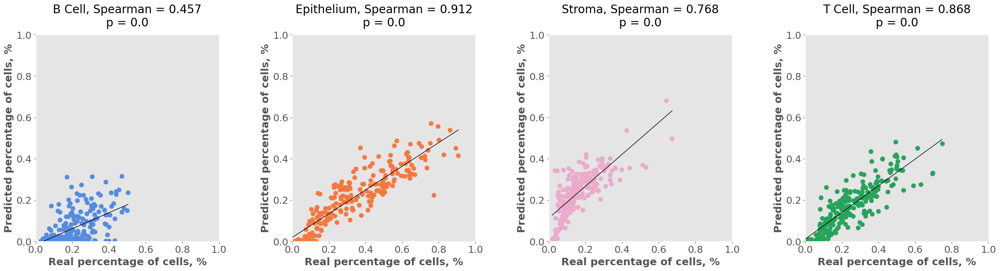

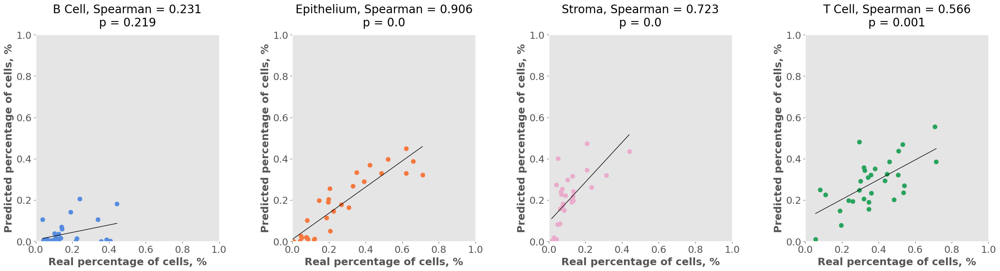

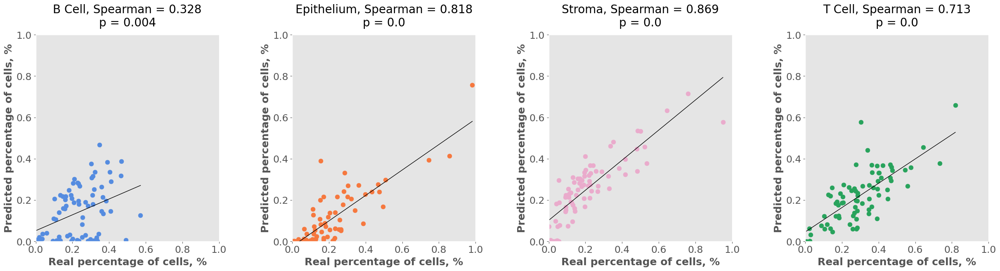

In [25]:
plot_object.plot_cell(cellanneal_atap_noM.T, atap_true_general.T, pallete=cells_p)
plot_object.plot_cell(cellanneal_cleveland_noM.T, cleveland_true_general.T, pallete=cells_p)
plot_object.plot_cell(cellanneal_lmu_noM.T, lmu_true_general.T, pallete=cells_p)


array([<AxesSubplot: title={'center': 'B Cell, Spearman = 0.599\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Epithelium, Spearman = 0.801\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Stroma, Spearman = 0.641\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'T Cell, Spearman = 0.489\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>],
      dtype=object)

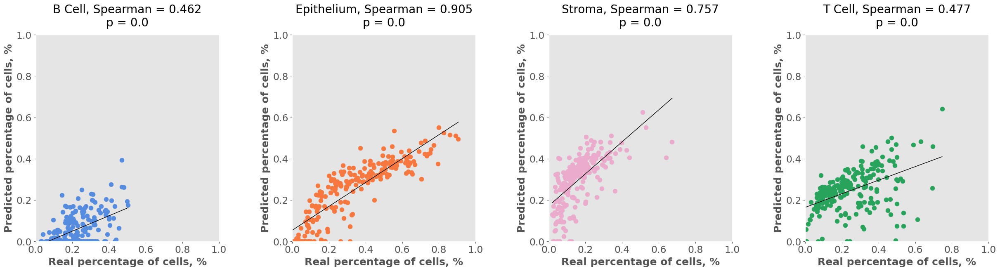

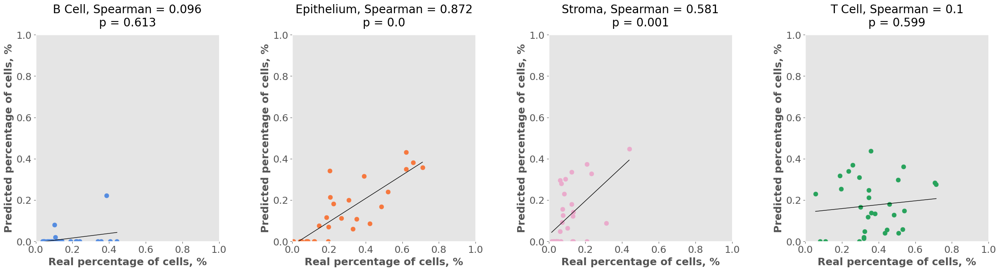

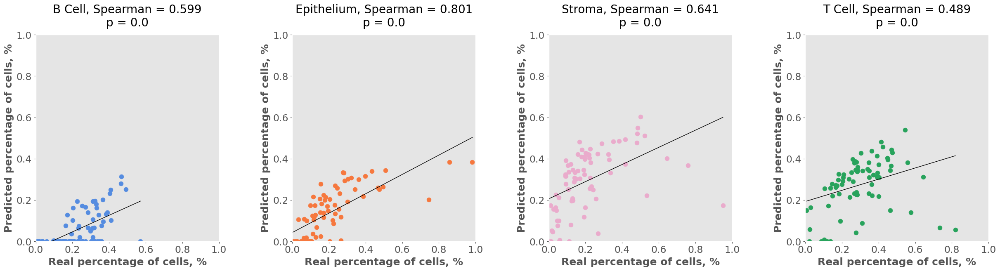

In [26]:
plot_object.plot_cell(svr_atap_noM, atap_true_general.T, pallete=cells_p)
plot_object.plot_cell(svr_cleveland_noM, cleveland_true_general.T, pallete=cells_p)
plot_object.plot_cell(svr_lmu_noM, lmu_true_general.T, pallete=cells_p)

no Stroma

In [27]:
if train_flag:
    temp = signature.drop("Stroma", axis=1)
    models = deconvolution_object.train(temp, atap_bulk)
    models[0].to_csv("../data/results4/cellanneal_atap_logcpm_noS.csv")
    models[1].to_csv("../data/results4/svr_atap_logcpm_noS.csv")
    models = deconvolution_object.train(temp, cleveland_bulk)
    models[0].to_csv("../data/results4/cellanneal_cleveland_logcpm_noS.csv")
    models[1].to_csv("../data/results4/svr_cleveland_logcpm_noS.csv")
    models = deconvolution_object.train(temp, lmu_bulk)
    models[0].to_csv("../data/results4/cellanneal_lmu_logcpm_noS.csv")
    models[1].to_csv("../data/results4/svr_lmu_logcpm_noS.csv")
else:
    cellanneal_atap_noS = pd.read_csv("../data/results4/cellanneal_atap_logcpm_noS.csv", index_col=0)
    svr_atap_noS = pd.read_csv("../data/results4/svr_atap_logcpm_noS.csv", index_col=0)
    cellanneal_cleveland_noS = pd.read_csv("../data/results4/cellanneal_cleveland_logcpm_noS.csv", index_col=0)
    svr_cleveland_noS = pd.read_csv("../data/results4/svr_cleveland_logcpm_noS.csv", index_col=0)
    cellanneal_lmu_noS = pd.read_csv("../data/results4/cellanneal_lmu_logcpm_noS.csv", index_col=0)
    svr_lmu_noS = pd.read_csv("../data/results4/svr_lmu_logcpm_noS.csv", index_col=0)

array([<AxesSubplot: title={'center': 'B Cell, Spearman = 0.473\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Epithelium, Spearman = 0.815\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Myeloid, Spearman = 0.182\np = 0.115'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'T Cell, Spearman = 0.586\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>],
      dtype=object)

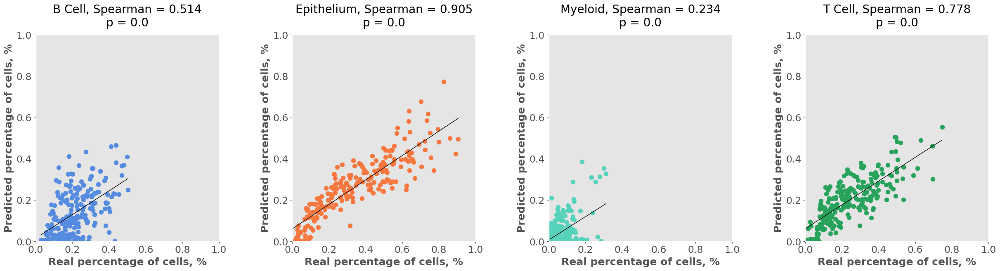

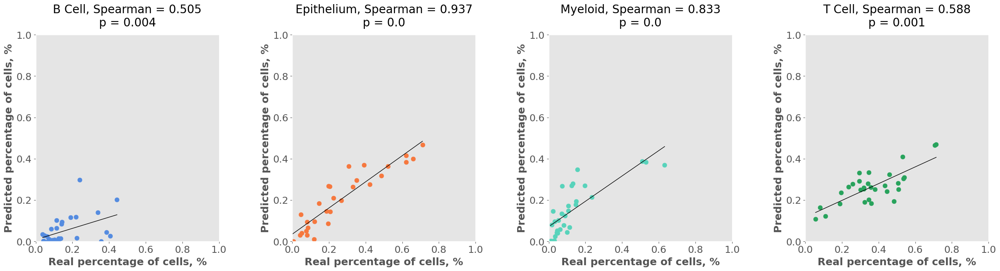

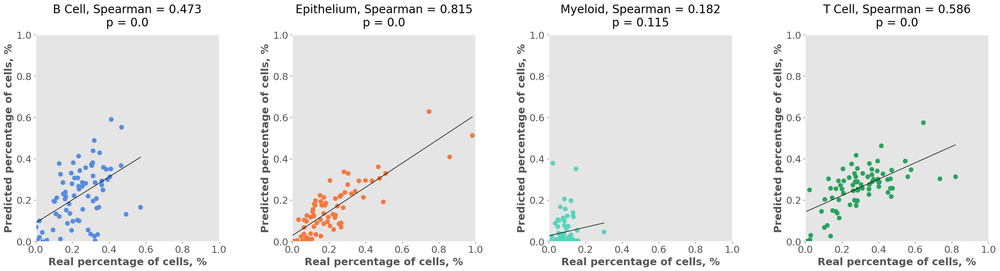

In [28]:
plot_object.plot_cell(cellanneal_atap_noS.T, atap_true_general.T, pallete=cells_p)
plot_object.plot_cell(cellanneal_cleveland_noS.T, cleveland_true_general.T, pallete=cells_p)
plot_object.plot_cell(cellanneal_lmu_noS.T, lmu_true_general.T, pallete=cells_p)


array([<AxesSubplot: title={'center': 'B Cell, Spearman = 0.204\np = 0.078'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Epithelium, Spearman = 0.355\np = 0.002'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Myeloid, Spearman = 0.062\np = 0.592'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'T Cell, Spearman = 0.67\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>],
      dtype=object)

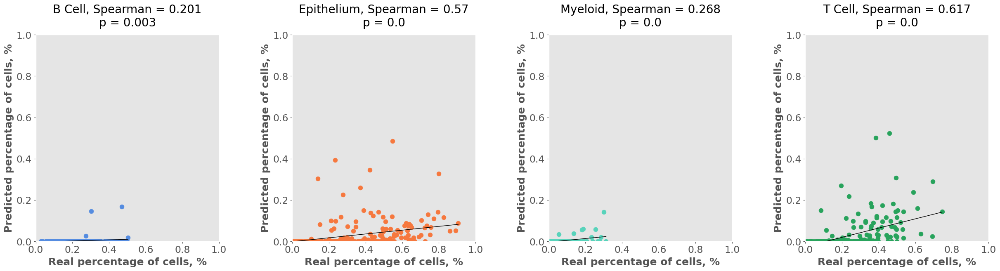

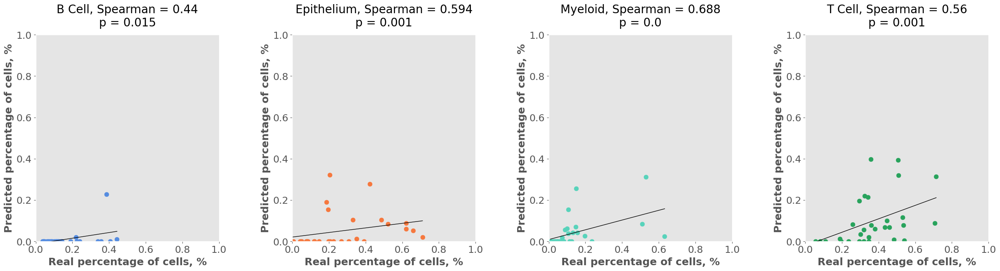

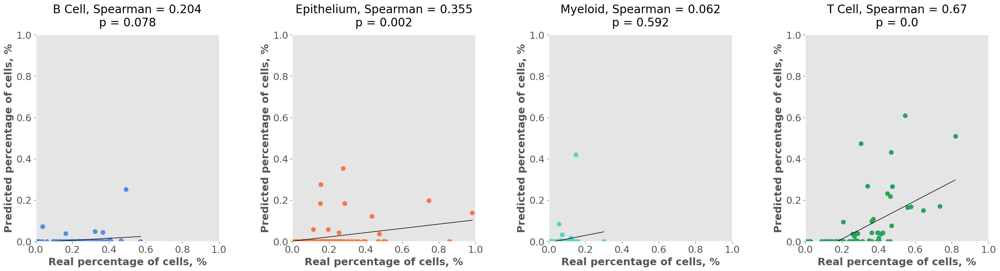

In [29]:
plot_object.plot_cell(svr_atap_noS, atap_true_general.T, pallete=cells_p)
plot_object.plot_cell(svr_cleveland_noS, cleveland_true_general.T, pallete=cells_p)
plot_object.plot_cell(svr_lmu_noS, lmu_true_general.T, pallete=cells_p)

# log normalized data

In [30]:
signature = pd.read_csv('../../../../../cbbi-data00/projects/Methods/bulk-deconvolution/marker_gene_expression.by_compartments.csv',index_col=0).T
atap_bulk = pd.read_csv('../data/atap.pseudobulk_counts.log_normal.csv',index_col=0).T
cleveland_bulk = pd.read_csv('../data/cleveland.pseudobulk_counts.log_normal.csv',index_col=0).T
lmu_bulk = pd.read_csv('../data/lmu.pseudobulk_counts.log_normal.csv',index_col=0).T

In [31]:
signature = signature.rename({"Unknown": "Other1"},axis=1)
signature["Other2"] = 0
signature["Other3"] = signature.mean(axis=1)
signature

,B Cell,Epithelium,Myeloid,Stroma,T Cell,Other1,Other2,Other3
KDR,0.000570,0.001089,0.000734,0.124541,0.000624,0.002537,0,0.018585
IGKV1D-8,0.001335,0.000000,0.000000,0.000075,0.000000,0.001989,0,0.000486
MS4A1,0.681195,0.001444,0.003898,0.001195,0.006372,0.070019,0,0.109160
LGI4,0.000206,0.004018,0.000724,0.148604,0.000845,0.005531,0,0.022847
KCNE4,0.000245,0.001603,0.000060,0.090809,0.000388,0.001103,0,0.013458
...,...,...,...,...,...,...,...,...
PIK3R5,0.013040,0.016007,0.028485,0.000449,0.035005,0.005545,0,0.014076
CTLA4,0.003462,0.001163,0.004524,0.000871,0.186955,0.016716,0,0.030527
SOX17,0.000134,0.000372,0.000211,0.057668,0.000441,0.001940,0,0.008681
CD68,0.007961,0.028243,0.315962,0.012182,0.006138,0.006983,0,0.053924


In [32]:
if train_flag:
    temp = signature.drop("B Cell", axis=1)
    models = deconvolution_object.train(temp, atap_bulk)
    models[0].to_csv("../data/results4/cellanneal_atap_lognorm_noB.csv")
    models[1].to_csv("../data/results4/svr_atap_lognorm_noB.csv")
    models = deconvolution_object.train(temp, cleveland_bulk)
    models[0].to_csv("../data/results4/cellanneal_cleveland_lognorm_noB.csv")
    models[1].to_csv("../data/results4/svr_cleveland_lognorm_noB.csv")
    models = deconvolution_object.train(temp, lmu_bulk)
    models[0].to_csv("../data/results4/cellanneal_lmu_lognorm_noB.csv")
    models[1].to_csv("../data/results4/svr_lmu_lognorm_noB.csv")
else:
    cellanneal_atap_noB = pd.read_csv("../data/results4/cellanneal_atap_lognorm_noB.csv", index_col=0)
    svr_atap_noB = pd.read_csv("../data/results4/svr_atap_lognorm_noB.csv", index_col=0)
    cellanneal_cleveland_noB = pd.read_csv("../data/results4/cellanneal_cleveland_lognorm_noB.csv", index_col=0)
    svr_cleveland_noB = pd.read_csv("../data/results4/svr_cleveland_lognorm_noB.csv", index_col=0)
    cellanneal_lmu_noB = pd.read_csv("../data/results4/cellanneal_lmu_lognorm_noB.csv", index_col=0)
    svr_lmu_noB = pd.read_csv("../data/results4/svr_lmu_lognorm_noB.csv", index_col=0)

array([<AxesSubplot: title={'center': 'Epithelium, Spearman = 0.825\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Myeloid, Spearman = 0.172\np = 0.137'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Stroma, Spearman = 0.817\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'T Cell, Spearman = 0.809\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>],
      dtype=object)

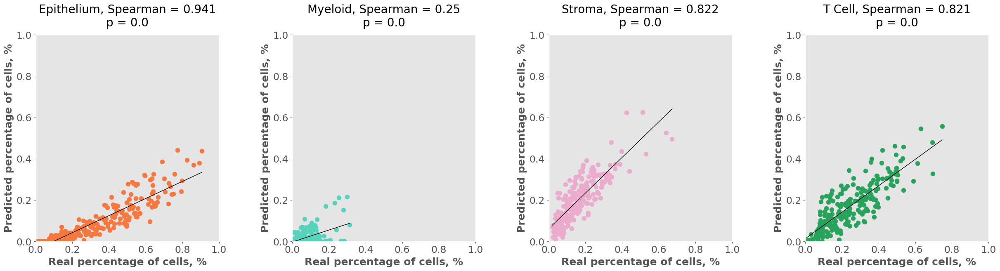

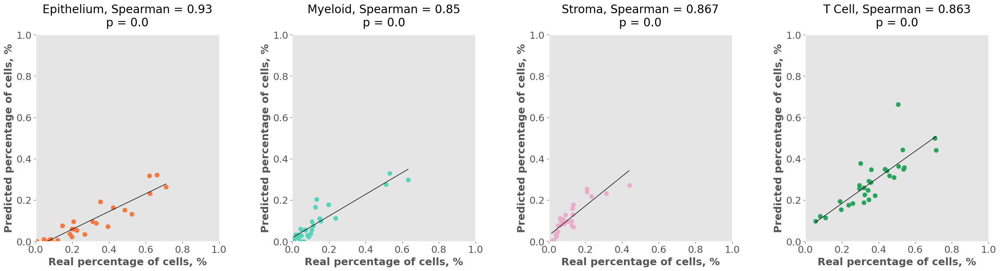

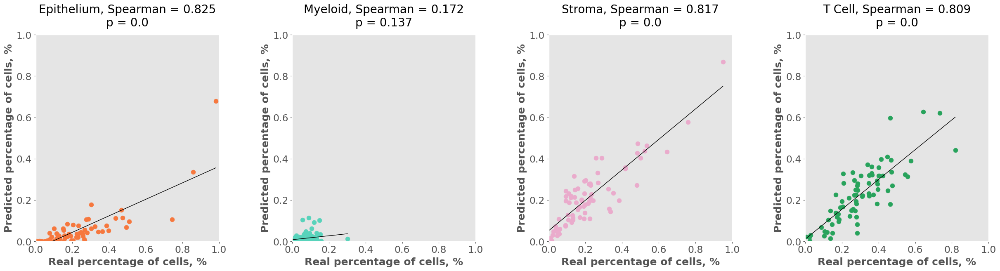

In [33]:
plot_object.plot_cell(cellanneal_atap_noB.T, atap_true_general.T, pallete=cells_p)
plot_object.plot_cell(cellanneal_cleveland_noB.T, cleveland_true_general.T, pallete=cells_p)
plot_object.plot_cell(cellanneal_lmu_noB.T, lmu_true_general.T, pallete=cells_p)


array([<AxesSubplot: title={'center': 'Epithelium, Spearman = 0.733\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Myeloid, Spearman = -0.05\np = 0.67'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Stroma, Spearman = 0.74\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'T Cell, Spearman = 0.361\np = 0.001'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>],
      dtype=object)

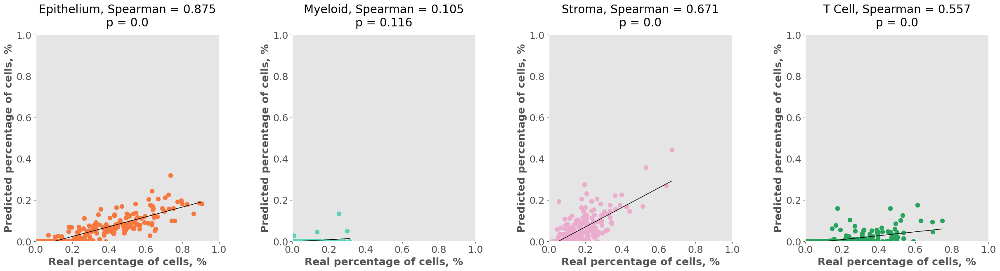

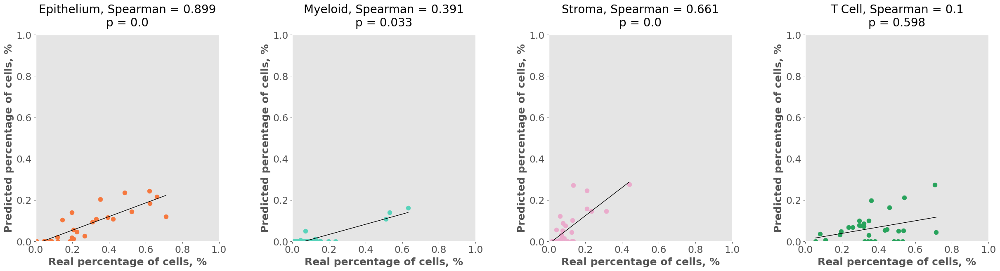

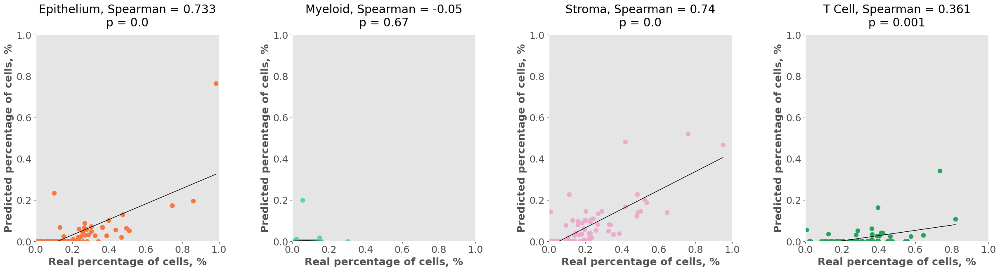

In [34]:
plot_object.plot_cell(svr_atap_noB, atap_true_general.T, pallete=cells_p)
plot_object.plot_cell(svr_cleveland_noB, cleveland_true_general.T, pallete=cells_p)
plot_object.plot_cell(svr_lmu_noB, lmu_true_general.T, pallete=cells_p)

In [35]:
if train_flag:
    temp = signature.drop("T Cell", axis=1)
    models = deconvolution_object.train(temp, atap_bulk)
    models[0].to_csv("../data/results4/cellanneal_atap_lognorm_noT.csv")
    models[1].to_csv("../data/results4/svr_atap_lognorm_noT.csv")
    models = deconvolution_object.train(temp, cleveland_bulk)
    models[0].to_csv("../data/results4/cellanneal_cleveland_lognorm_noT.csv")
    models[1].to_csv("../data/results4/svr_cleveland_lognorm_noT.csv")
    models = deconvolution_object.train(temp, lmu_bulk)
    models[0].to_csv("../data/results4/cellanneal_lmu_lognorm_noT.csv")
    models[1].to_csv("../data/results4/svr_lmu_lognorm_noT.csv")
else:
    cellanneal_atap_noT = pd.read_csv("../data/results4/cellanneal_atap_lognorm_noT.csv", index_col=0)
    svr_atap_noT = pd.read_csv("../data/results4/svr_atap_lognorm_noT.csv", index_col=0)
    cellanneal_cleveland_noT = pd.read_csv("../data/results4/cellanneal_cleveland_lognorm_noT.csv", index_col=0)
    svr_cleveland_noT = pd.read_csv("../data/results4/svr_cleveland_lognorm_noT.csv", index_col=0)
    cellanneal_lmu_noT = pd.read_csv("../data/results4/cellanneal_lmu_lognorm_noT.csv", index_col=0)
    svr_lmu_noT = pd.read_csv("../data/results4/svr_lmu_lognorm_noT.csv", index_col=0)

array([<AxesSubplot: title={'center': 'B Cell, Spearman = 0.6\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Epithelium, Spearman = 0.817\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Myeloid, Spearman = 0.278\np = 0.015'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Stroma, Spearman = 0.846\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>],
      dtype=object)

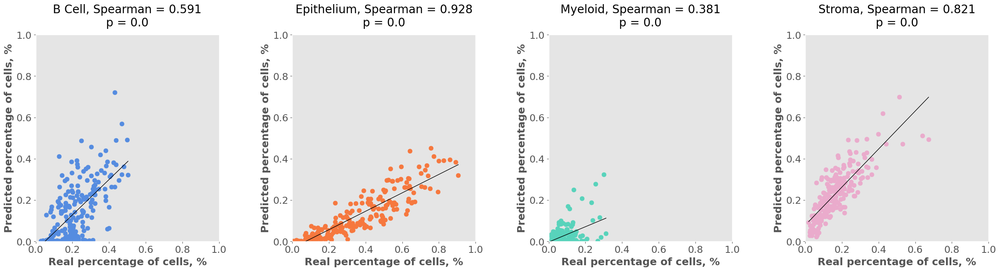

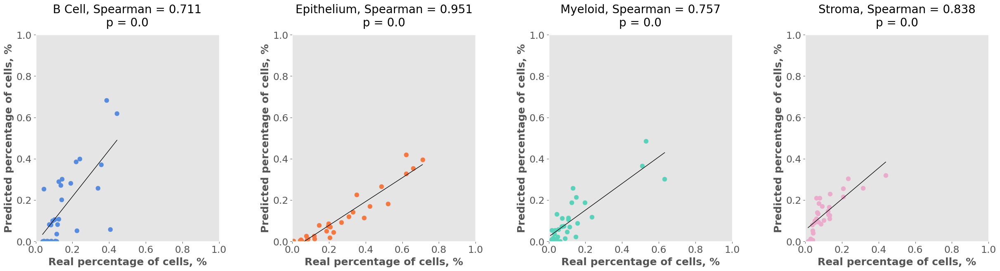

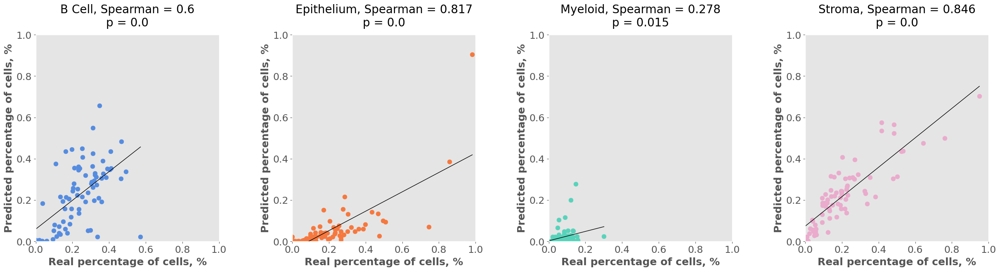

In [36]:
plot_object.plot_cell(cellanneal_atap_noT.T, atap_true_general.T, pallete=cells_p)
plot_object.plot_cell(cellanneal_cleveland_noT.T, cleveland_true_general.T, pallete=cells_p)
plot_object.plot_cell(cellanneal_lmu_noT.T, lmu_true_general.T, pallete=cells_p)


array([<AxesSubplot: title={'center': 'B Cell, Spearman = 0.457\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Epithelium, Spearman = 0.836\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Myeloid, Spearman = -0.255\np = 0.026'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Stroma, Spearman = 0.831\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>],
      dtype=object)

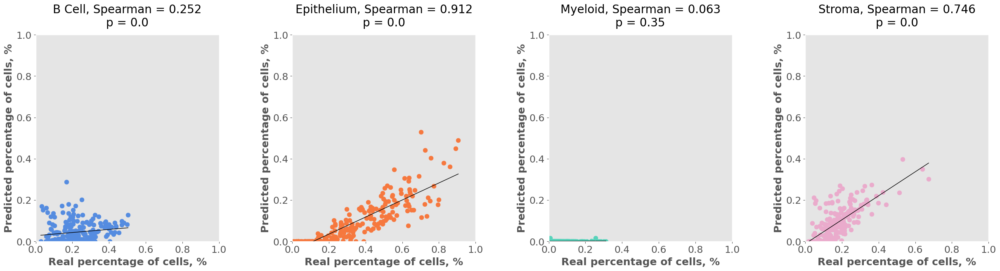

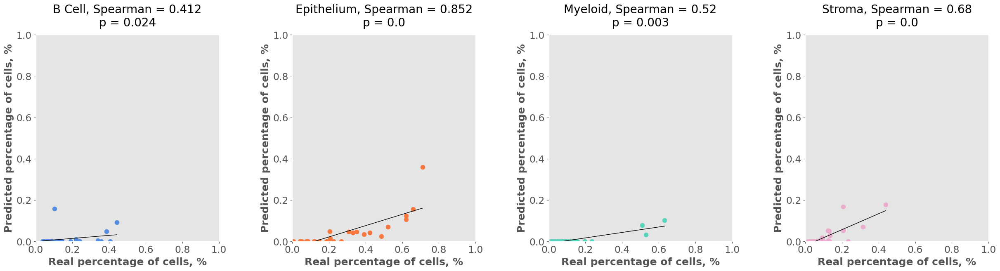

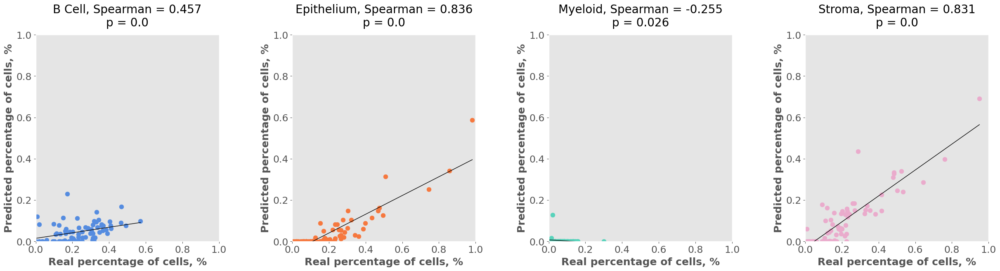

In [37]:
plot_object.plot_cell(svr_atap_noT, atap_true_general.T, pallete=cells_p)
plot_object.plot_cell(svr_cleveland_noT, cleveland_true_general.T, pallete=cells_p)
plot_object.plot_cell(svr_lmu_noT, lmu_true_general.T, pallete=cells_p)

In [38]:
if train_flag:
    temp = signature.drop("Epithelium", axis=1)
    models = deconvolution_object.train(temp, atap_bulk)
    models[0].to_csv("../data/results4/cellanneal_atap_lognorm_noE.csv")
    models[1].to_csv("../data/results4/svr_atap_lognorm_noE.csv")
    models = deconvolution_object.train(temp, cleveland_bulk)
    models[0].to_csv("../data/results4/cellanneal_cleveland_lognorm_noE.csv")
    models[1].to_csv("../data/results4/svr_cleveland_lognorm_noE.csv")
    models = deconvolution_object.train(temp, lmu_bulk)
    models[0].to_csv("../data/results4/cellanneal_lmu_lognorm_noE.csv")
    models[1].to_csv("../data/results4/svr_lmu_lognorm_noE.csv")
else:
    cellanneal_atap_noE = pd.read_csv("../data/results4/cellanneal_atap_lognorm_noE.csv", index_col=0)
    svr_atap_noE = pd.read_csv("../data/results4/svr_atap_lognorm_noE.csv", index_col=0)
    cellanneal_cleveland_noE = pd.read_csv("../data/results4/cellanneal_cleveland_lognorm_noE.csv", index_col=0)
    svr_cleveland_noE = pd.read_csv("../data/results4/svr_cleveland_lognorm_noE.csv", index_col=0)
    cellanneal_lmu_noE = pd.read_csv("../data/results4/cellanneal_lmu_lognorm_noE.csv", index_col=0)
    svr_lmu_noE = pd.read_csv("../data/results4/svr_lmu_lognorm_noE.csv", index_col=0)

array([<AxesSubplot: title={'center': 'B Cell, Spearman = 0.566\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Myeloid, Spearman = 0.24\np = 0.037'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Stroma, Spearman = 0.835\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'T Cell, Spearman = 0.774\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>],
      dtype=object)

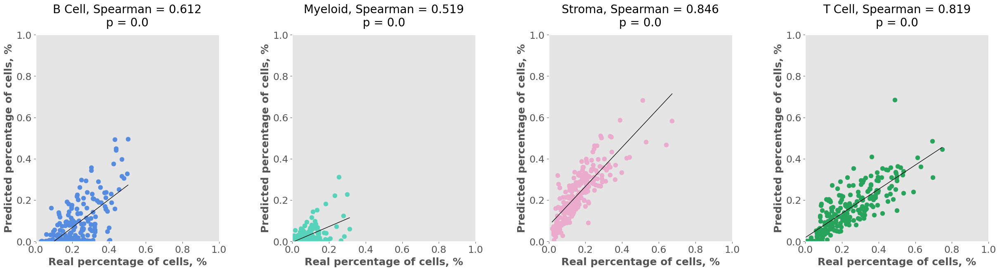

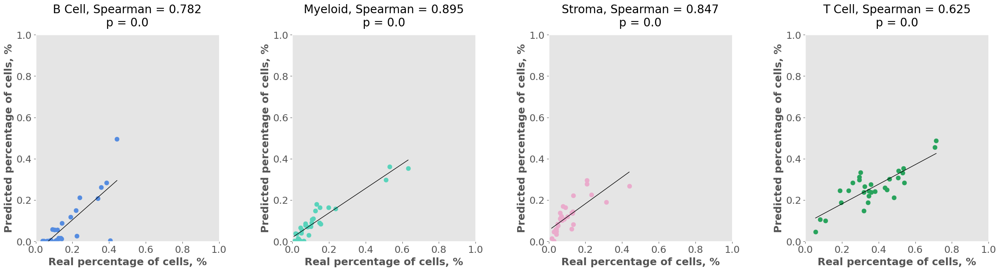

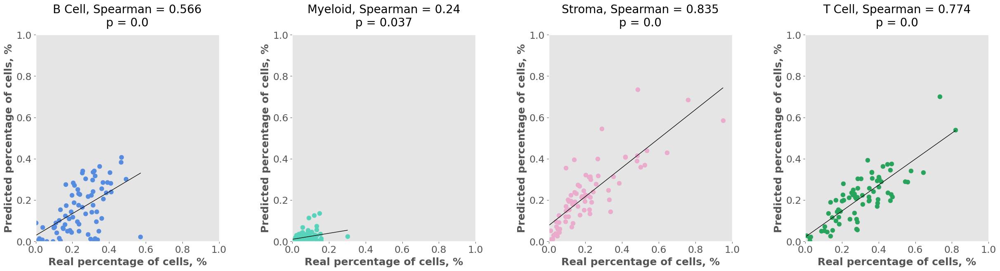

In [39]:
plot_object.plot_cell(cellanneal_atap_noE.T, atap_true_general.T, pallete=cells_p)
plot_object.plot_cell(cellanneal_cleveland_noE.T, cleveland_true_general.T, pallete=cells_p)
plot_object.plot_cell(cellanneal_lmu_noE.T, lmu_true_general.T, pallete=cells_p)

array([<AxesSubplot: title={'center': 'B Cell, Spearman = 0.488\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Myeloid, Spearman = 0.054\np = 0.641'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Stroma, Spearman = 0.761\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'T Cell, Spearman = 0.258\np = 0.024'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>],
      dtype=object)

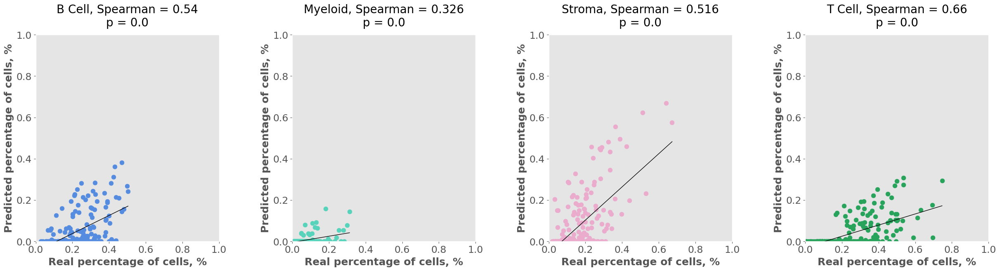

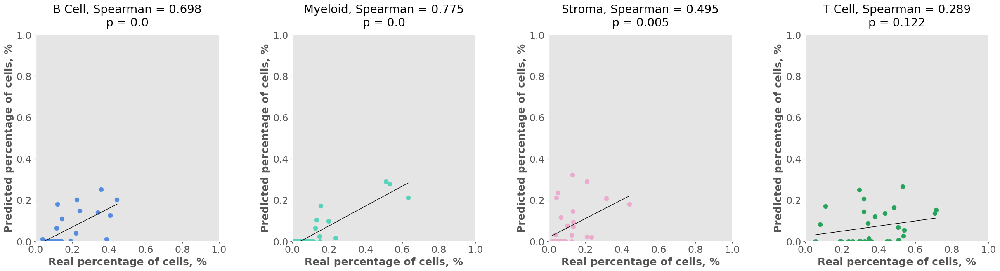

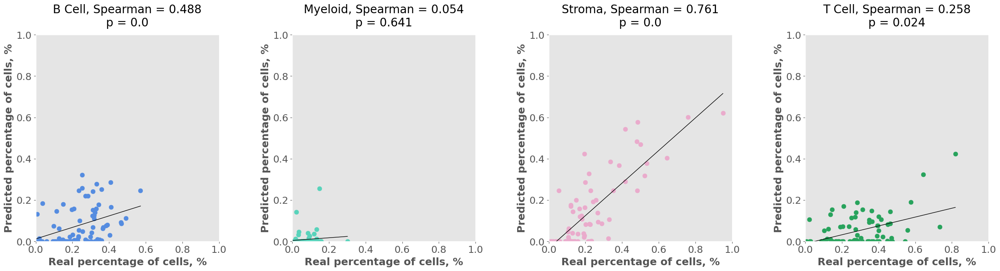

In [40]:
plot_object.plot_cell(svr_atap_noE, atap_true_general.T, pallete=cells_p)
plot_object.plot_cell(svr_cleveland_noE, cleveland_true_general.T, pallete=cells_p)
plot_object.plot_cell(svr_lmu_noE, lmu_true_general.T, pallete=cells_p)

In [41]:
if train_flag:
    temp = signature.drop("Myeloid", axis=1)
    models = deconvolution_object.train(temp, atap_bulk)
    models[0].to_csv("../data/results4/cellanneal_atap_lognorm_noM.csv")
    models[1].to_csv("../data/results4/svr_atap_lognorm_noM.csv")
    models = deconvolution_object.train(temp, cleveland_bulk)
    models[0].to_csv("../data/results4/cellanneal_cleveland_lognorm_noM.csv")
    models[1].to_csv("../data/results4/svr_cleveland_lognorm_noM.csv")
    models = deconvolution_object.train(temp, lmu_bulk)
    models[0].to_csv("../data/results4/cellanneal_lmu_lognorm_noM.csv")
    models[1].to_csv("../data/results4/svr_lmu_lognorm_noM.csv")
else:
    cellanneal_atap_noM = pd.read_csv("../data/results4/cellanneal_atap_lognorm_noM.csv", index_col=0)
    svr_atap_noM = pd.read_csv("../data/results4/svr_atap_lognorm_noM.csv", index_col=0)
    cellanneal_cleveland_noM = pd.read_csv("../data/results4/cellanneal_cleveland_lognorm_noM.csv", index_col=0)
    svr_cleveland_noM = pd.read_csv("../data/results4/svr_cleveland_lognorm_noM.csv", index_col=0)
    cellanneal_lmu_noM = pd.read_csv("../data/results4/cellanneal_lmu_lognorm_noM.csv", index_col=0)
    svr_lmu_noM = pd.read_csv("../data/results4/svr_lmu_lognorm_noM.csv", index_col=0)

array([<AxesSubplot: title={'center': 'B Cell, Spearman = 0.541\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Epithelium, Spearman = 0.821\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Stroma, Spearman = 0.851\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'T Cell, Spearman = 0.781\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>],
      dtype=object)

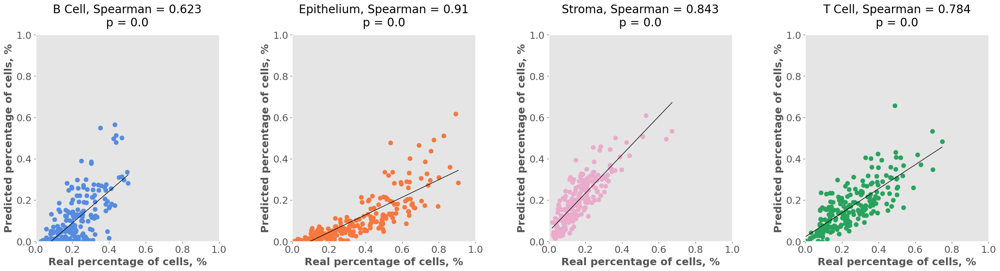

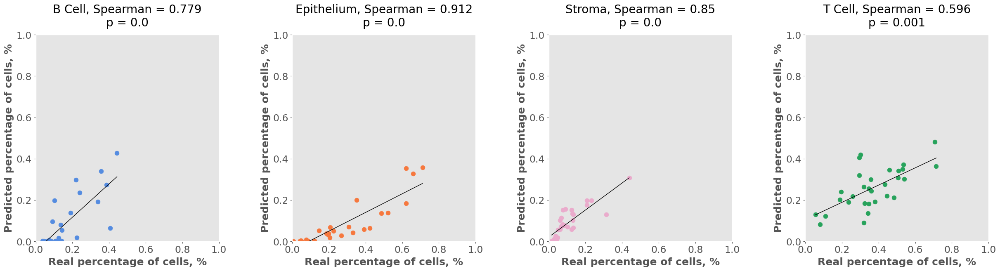

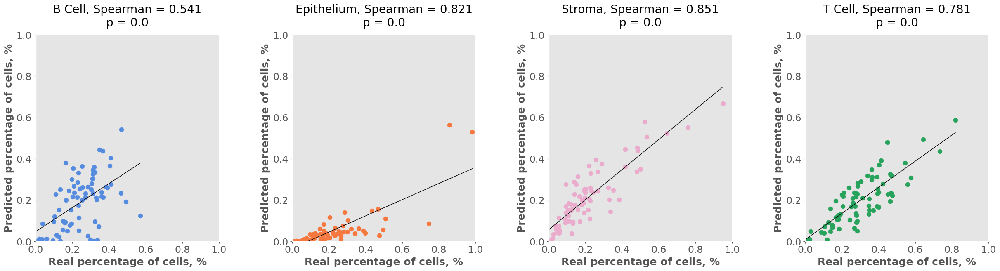

In [42]:
plot_object.plot_cell(cellanneal_atap_noM.T, atap_true_general.T, pallete=cells_p)
plot_object.plot_cell(cellanneal_cleveland_noM.T, cleveland_true_general.T, pallete=cells_p)
plot_object.plot_cell(cellanneal_lmu_noM.T, lmu_true_general.T, pallete=cells_p)


array([<AxesSubplot: title={'center': 'B Cell, Spearman = 0.725\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Epithelium, Spearman = 0.87\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Stroma, Spearman = 0.853\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'T Cell, Spearman = 0.487\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>],
      dtype=object)

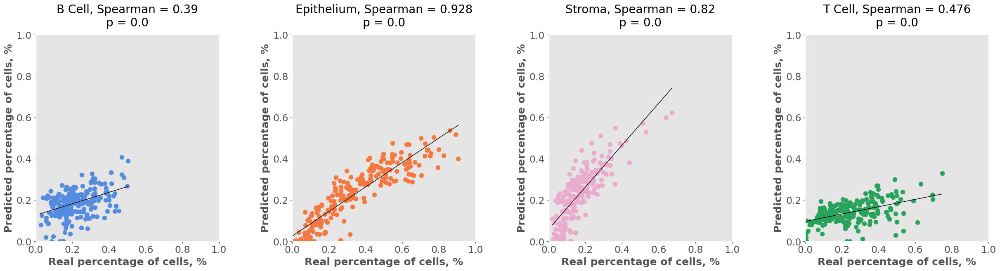

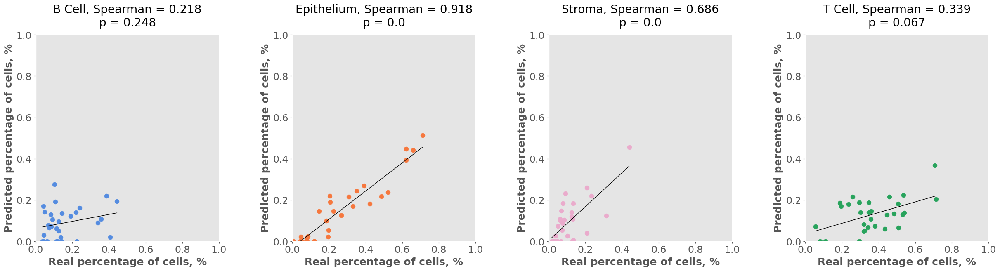

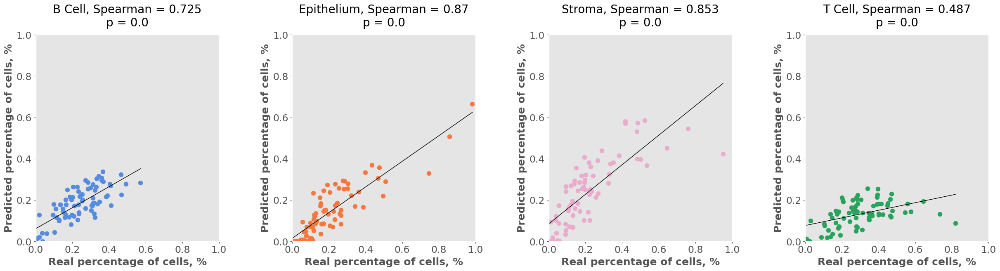

In [43]:
plot_object.plot_cell(svr_atap_noM, atap_true_general.T, pallete=cells_p)
plot_object.plot_cell(svr_cleveland_noM, cleveland_true_general.T, pallete=cells_p)
plot_object.plot_cell(svr_lmu_noM, lmu_true_general.T, pallete=cells_p)

In [44]:
if train_flag:
    temp = signature.drop("Stroma", axis=1)
    models = deconvolution_object.train(temp, atap_bulk)
    models[0].to_csv("../data/results4/cellanneal_atap_lognorm_noS.csv")
    models[1].to_csv("../data/results4/svr_atap_lognorm_noS.csv")
    models = deconvolution_object.train(temp, cleveland_bulk)
    models[0].to_csv("../data/results4/cellanneal_cleveland_lognorm_noS.csv")
    models[1].to_csv("../data/results4/svr_cleveland_lognorm_noS.csv")
    models = deconvolution_object.train(temp, lmu_bulk)
    models[0].to_csv("../data/results4/cellanneal_lmu_lognorm_noS.csv")
    models[1].to_csv("../data/results4/svr_lmu_lognorm_noS.csv")
else:
    cellanneal_atap_noS = pd.read_csv("../data/results4/cellanneal_atap_lognorm_noS.csv", index_col=0)
    svr_atap_noS = pd.read_csv("../data/results4/svr_atap_lognorm_noS.csv", index_col=0)
    cellanneal_cleveland_noS = pd.read_csv("../data/results4/cellanneal_cleveland_lognorm_noS.csv", index_col=0)
    svr_cleveland_noS = pd.read_csv("../data/results4/svr_cleveland_lognorm_noS.csv", index_col=0)
    cellanneal_lmu_noS = pd.read_csv("../data/results4/cellanneal_lmu_lognorm_noS.csv", index_col=0)
    svr_lmu_noS = pd.read_csv("../data/results4/svr_lmu_lognorm_noS.csv", index_col=0)

array([<AxesSubplot: title={'center': 'B Cell, Spearman = 0.697\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Epithelium, Spearman = 0.78\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Myeloid, Spearman = 0.263\np = 0.022'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'T Cell, Spearman = 0.731\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>],
      dtype=object)

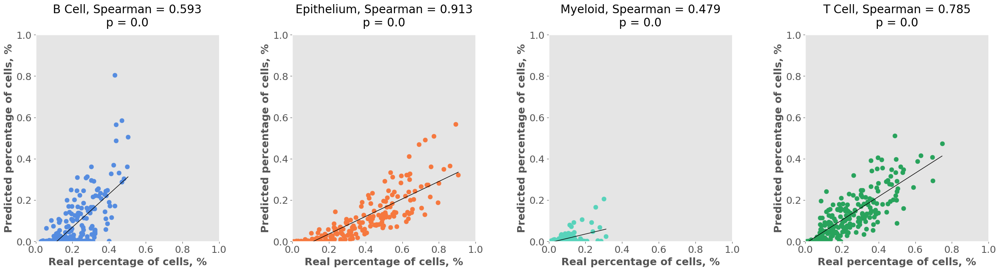

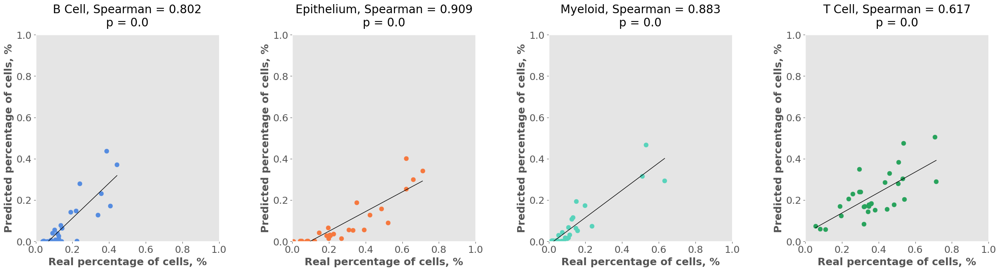

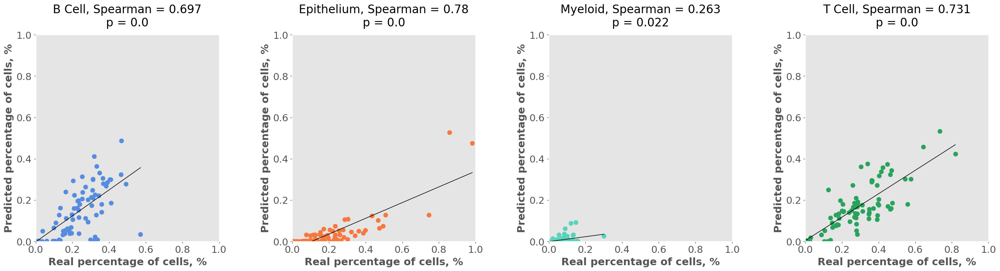

In [45]:
plot_object.plot_cell(cellanneal_atap_noS.T, atap_true_general.T, pallete=cells_p)
plot_object.plot_cell(cellanneal_cleveland_noS.T, cleveland_true_general.T, pallete=cells_p)
plot_object.plot_cell(cellanneal_lmu_noS.T, lmu_true_general.T, pallete=cells_p)

array([<AxesSubplot: title={'center': 'B Cell, Spearman = 0.383\np = 0.001'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Epithelium, Spearman = 0.334\np = 0.003'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Myeloid, Spearman = 0.179\np = 0.121'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'T Cell, Spearman = 0.554\np = 0.0'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>],
      dtype=object)

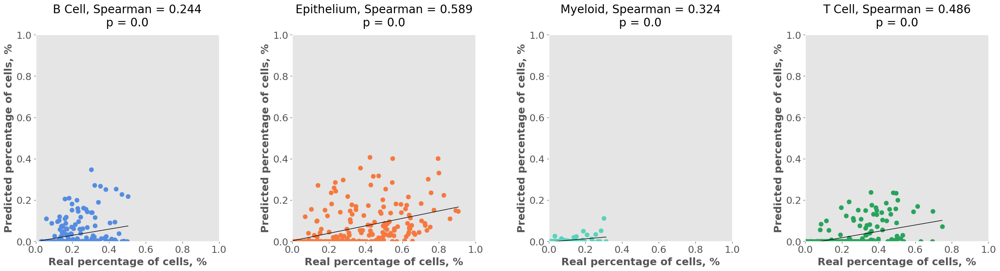

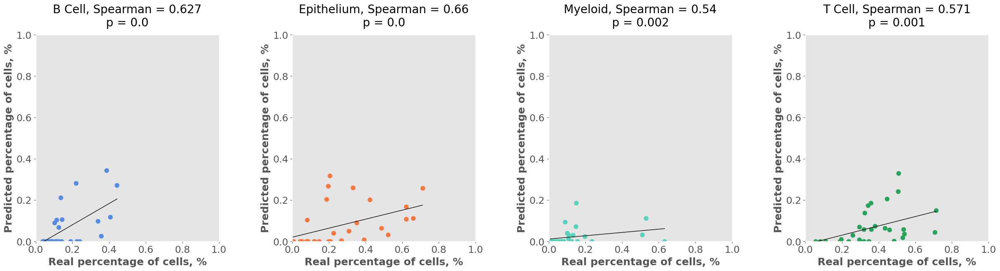

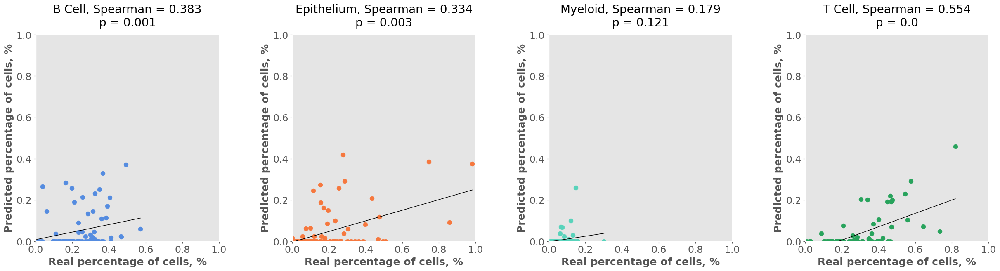

In [46]:
plot_object.plot_cell(svr_atap_noS, atap_true_general.T, pallete=cells_p)
plot_object.plot_cell(svr_cleveland_noS, cleveland_true_general.T, pallete=cells_p)
plot_object.plot_cell(svr_lmu_noS, lmu_true_general.T, pallete=cells_p)